In [102]:
from torchvision.datasets import MNIST
import torch
import torch.nn as nn
from torchvision import transforms
from torch.utils.data import DataLoader
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
from tqdm.auto import tqdm

In [103]:
def get_data(batch_size = 128):
    dataset = MNIST(".", download=True, transform=transforms.ToTensor())
    dataloader = DataLoader(dataset, batch_size, shuffle=True)
    return dataloader

In [104]:
def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in a uniform grid.
    '''
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], padding = 10, nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

In [105]:
def get_generator_block(input_dim, output_dim):
    '''
    Function for returning a block of the generator's neural network
    given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a generator neural network layer, with a linear transformation 
          followed by a batch normalization and then a relu activation
    '''
    return nn.Sequential(
        nn.Linear(in_features=input_dim, out_features=output_dim),
        nn.BatchNorm1d(num_features=output_dim),
        nn.ReLU(inplace=True)
    )

In [106]:
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim = 10, im_dim = 784, hidden_dim = 128):
        super(Generator, self).__init__()
        self.gen = nn.Sequential(
            get_generator_block(z_dim, hidden_dim),
            get_generator_block(hidden_dim, hidden_dim*2),
            get_generator_block(hidden_dim*2, hidden_dim*4),
            get_generator_block(hidden_dim*4, hidden_dim*8),
            nn.Linear(hidden_dim*8, im_dim),
            nn.Sigmoid()
        )
    def forward(self, noise):
        return self.gen(noise)
    

In [107]:
def get_noise(n_samples, z_dim, device):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim),
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
        n_samples: the number of samples to generate, a scalar
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    '''
    return torch.randn(n_samples, z_dim, device = device)

In [108]:
def get_discriminator_block(input_dim, output_dim):
    """
    
    """
    return nn.Sequential(
    nn.Linear(input_dim, output_dim),
    nn.LeakyReLU(negative_slope=0.02, inplace=True)
    )

In [109]:
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_dim = 784, hidden_dim = 128):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            get_discriminator_block(im_dim, hidden_dim * 4),
            get_discriminator_block(hidden_dim * 4, hidden_dim *2),
            get_discriminator_block(hidden_dim * 2, hidden_dim),
            nn.Linear(hidden_dim, 1)
        )
    def forward(self, image):
        return self.disc(image)

In [110]:
def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
    '''
    Return the loss of the discriminator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        real: a batch of real images
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        disc_loss: a torch scalar loss value for the current batch
    '''
    noise = get_noise(num_images, z_dim, device)
    fake = gen(noise).detach() # disc icin generator turev degerlerini almaya ihtiyac yok
    pred_fake = disc(fake)
    target = torch.zeros_like(pred_fake)
    loss1 = criterion(pred_fake, target)
    
    pred_real = disc(real)
    target = torch.ones_like(pred_real)
    loss2 = criterion(pred_real, target)
    
    disc_loss = (loss1 + loss2) / 2
    return disc_loss


In [111]:
def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):
    '''
    Return the loss of the generator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        gen_loss: a torch scalar loss value for the current batch
    '''
    noise = get_noise(num_images, z_dim, device)
    fake = gen(noise)
    pred = disc(fake)
    target = torch.ones_like(pred)
    gen_loss = criterion(pred, target)
    return gen_loss

## Training Loop

In [112]:
batch_size = 128
dataloader = get_data(batch_size)
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
lr = 0.00001
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


  0%|          | 0/9912422 [00:00<?, ?it/s]

Extracting ./MNIST/raw/train-images-idx3-ubyte.gz to ./MNIST/raw



  0%|          | 0/28881 [00:00<?, ?it/s]

Extracting ./MNIST/raw/train-labels-idx1-ubyte.gz to ./MNIST/raw



  0%|          | 0/1648877 [00:00<?, ?it/s]

Extracting ./MNIST/raw/t10k-images-idx3-ubyte.gz to ./MNIST/raw



  0%|          | 0/4542 [00:00<?, ?it/s]

Extracting ./MNIST/raw/t10k-labels-idx1-ubyte.gz to ./MNIST/raw



In [113]:
gen = Generator(z_dim).to(device)
disc = Discriminator().to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr = lr)
disc_opt = torch.optim.Adam(disc.parameters(), lr = lr)

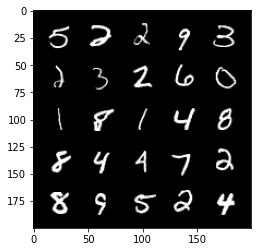

In [114]:
real = next(iter(dataloader))
real_img, _ = real[0], real[1]
real_img = real_img.view(128, -1).to(device)
show_tensor_images(real_img)

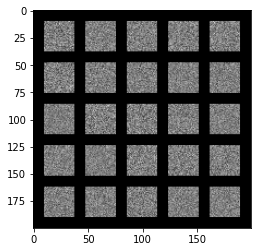

In [115]:
noise = get_noise(128, 64, device)
fake = gen(noise)

show_tensor_images(fake)

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.4166179597377777
Generator Loss : 1.313188910484314


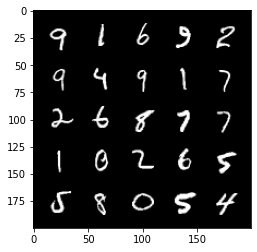

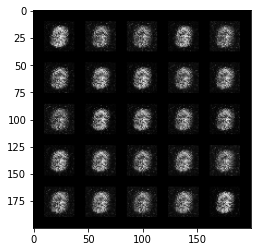

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.2767521142959595
Generator Loss : 1.6559642553329468


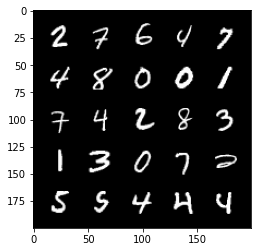

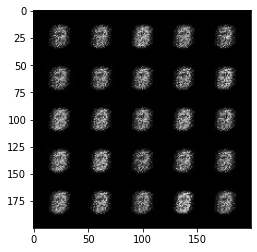

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.15844310820102692
Generator Loss : 2.0051326751708984


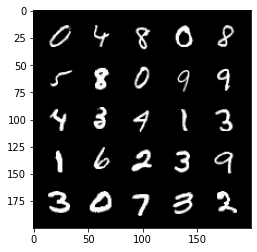

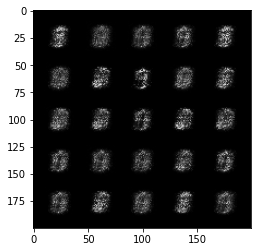

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.1678154170513153
Generator Loss : 1.8696297407150269


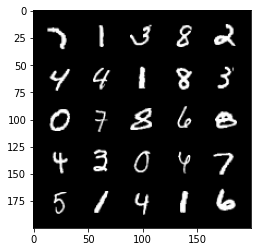

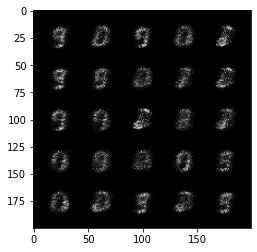

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.12928441166877747
Generator Loss : 2.131819248199463


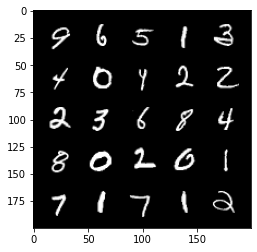

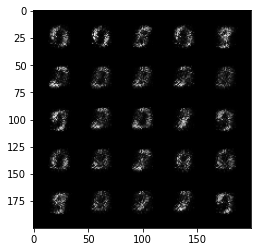

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.10484060645103455
Generator Loss : 2.552826166152954


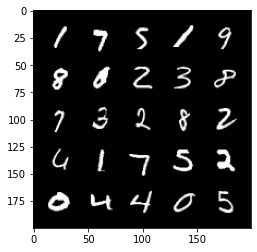

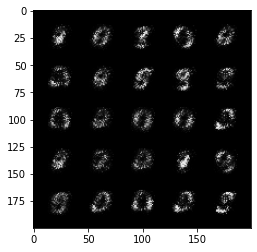

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.08654031902551651
Generator Loss : 2.992866277694702


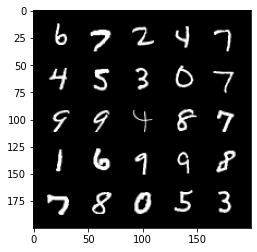

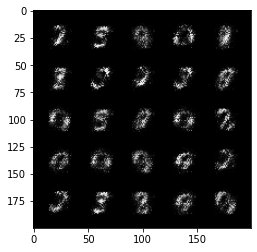

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.06938768178224564
Generator Loss : 3.3828296661376953


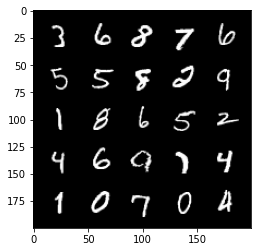

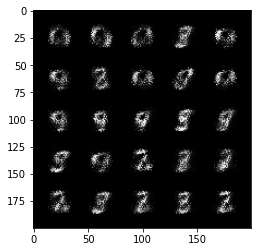

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.05172499641776085
Generator Loss : 3.7887825965881348


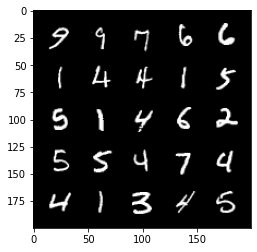

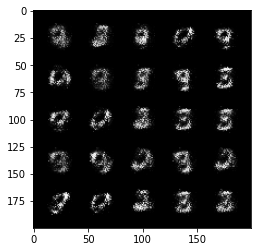

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.04188958555459976
Generator Loss : 3.99265456199646


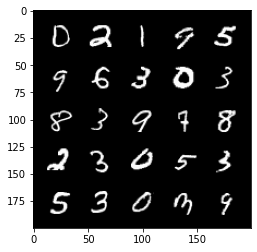

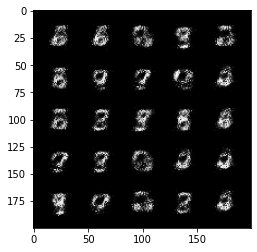

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.033312346786260605
Generator Loss : 4.39319372177124


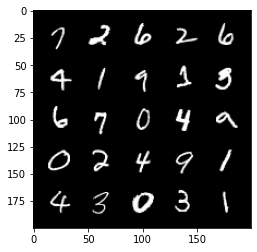

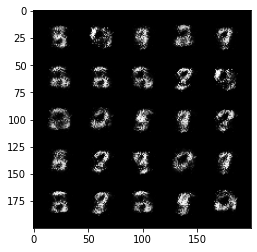

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.030789565294981003
Generator Loss : 4.651653289794922


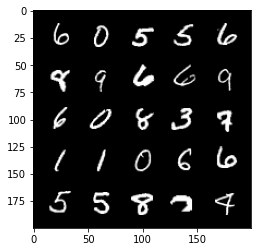

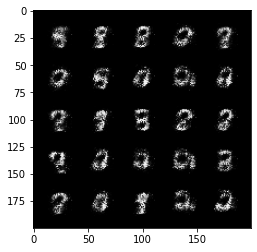

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.03379610925912857
Generator Loss : 4.6559224128723145


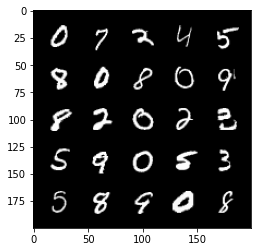

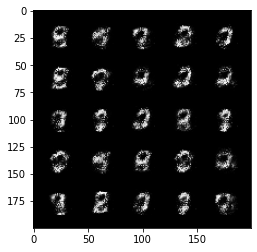

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.03229346498847008
Generator Loss : 4.818753719329834


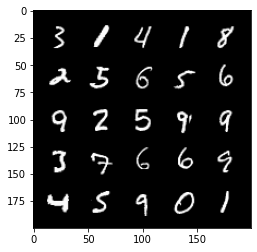

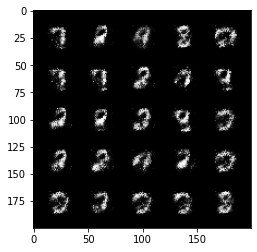

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.03306485712528229
Generator Loss : 4.949326992034912


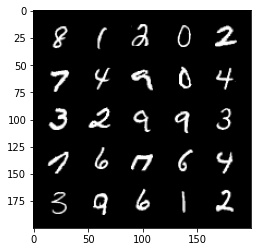

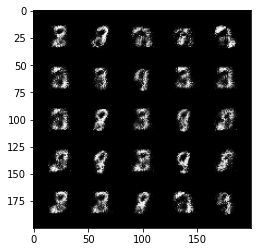

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.0382513627409935
Generator Loss : 4.516254425048828


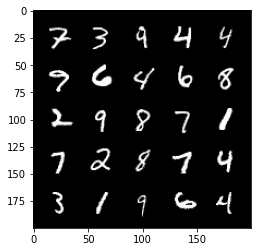

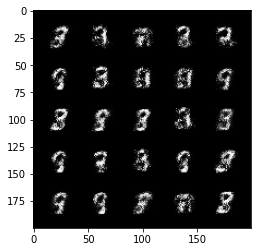

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.028147859498858452
Generator Loss : 5.063968181610107


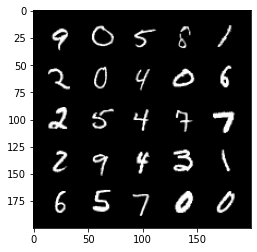

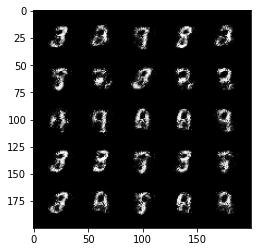

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.02975335158407688
Generator Loss : 5.012716293334961


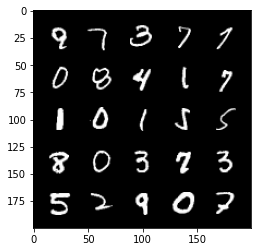

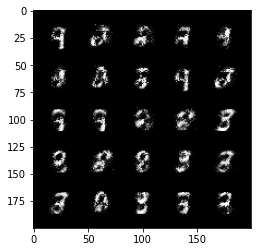

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.045130278915166855
Generator Loss : 4.754358291625977


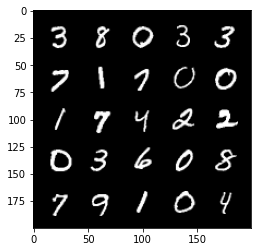

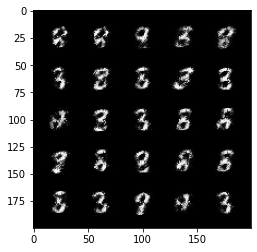

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.03987503796815872
Generator Loss : 4.828562259674072


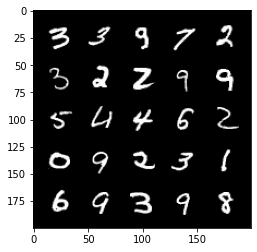

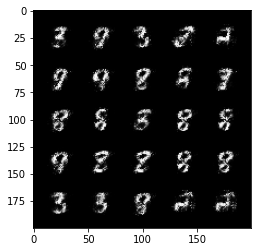

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.044754549860954285
Generator Loss : 4.620498180389404


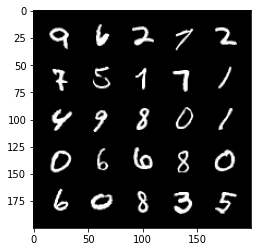

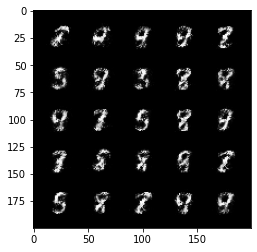

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.04611021652817726
Generator Loss : 4.822762489318848


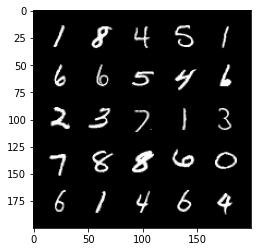

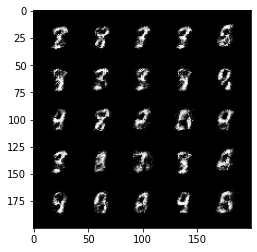

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.05733204632997513
Generator Loss : 4.701389789581299


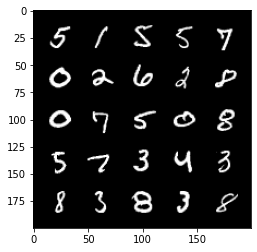

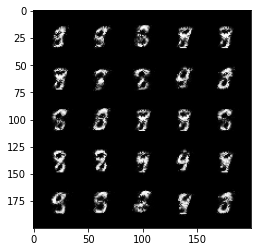

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.05758935958147049
Generator Loss : 4.537268161773682


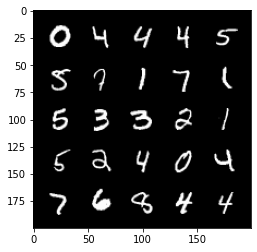

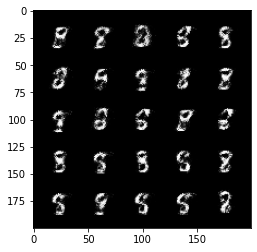

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.060868509113788605
Generator Loss : 4.503675937652588


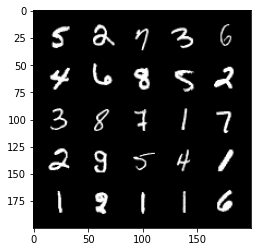

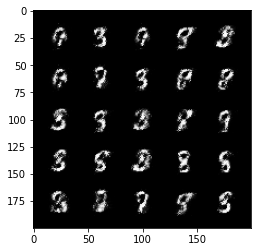

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.06272821873426437
Generator Loss : 4.335569858551025


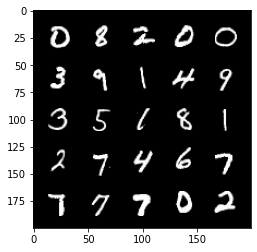

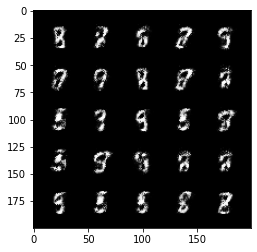

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.05902687832713127
Generator Loss : 4.498138427734375


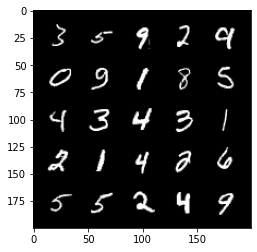

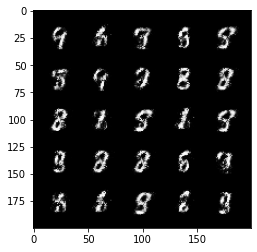

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.06364194303750992
Generator Loss : 4.436791896820068


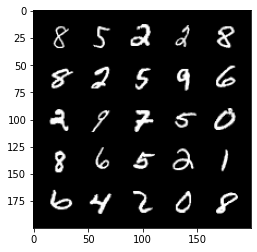

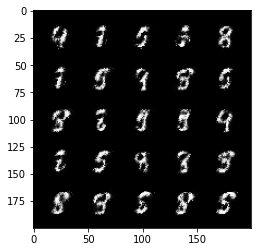

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.06305371224880219
Generator Loss : 4.735815525054932


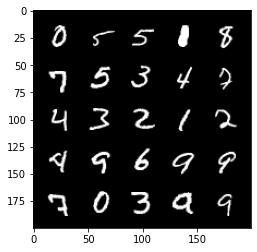

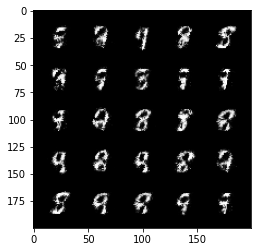

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.06670338660478592
Generator Loss : 4.810014247894287


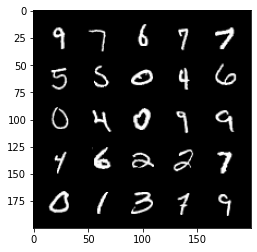

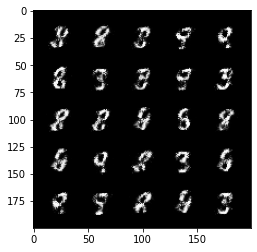

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.07304970920085907
Generator Loss : 4.34773063659668


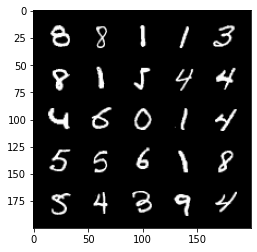

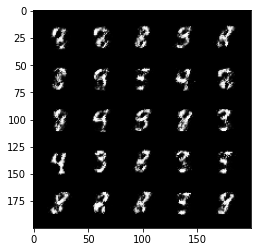

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.07048213481903076
Generator Loss : 4.586791038513184


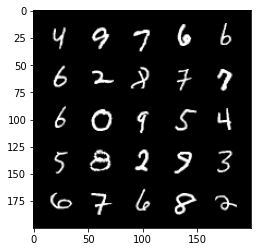

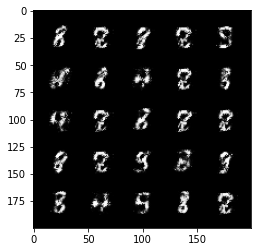

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.07173781841993332
Generator Loss : 4.576996326446533


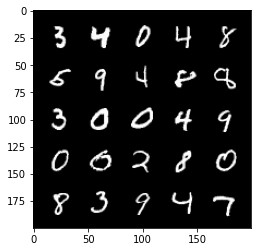

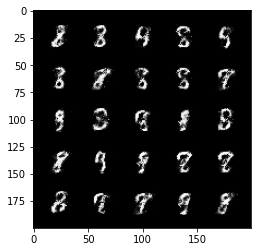

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.07812575250864029
Generator Loss : 4.491214275360107


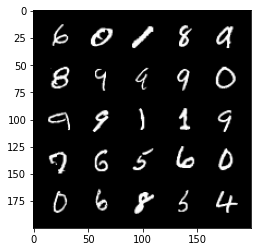

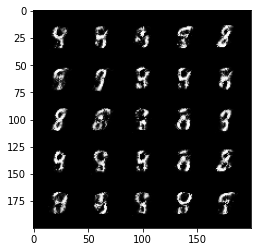

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.07939973473548889
Generator Loss : 4.454190254211426


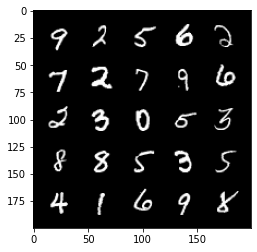

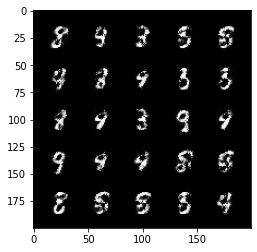

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.083803690969944
Generator Loss : 4.620028018951416


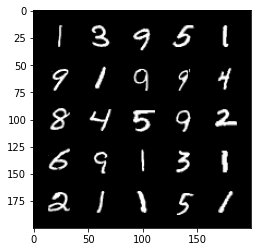

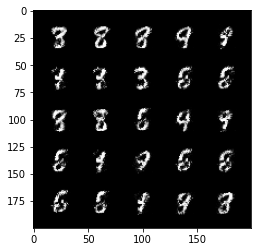

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.08618389070034027
Generator Loss : 4.563611030578613


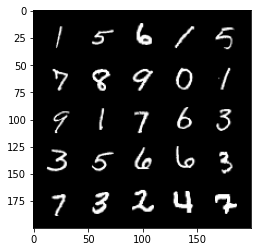

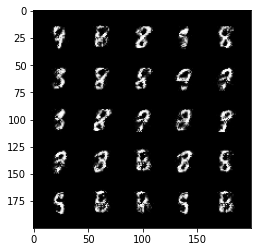

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.08945301920175552
Generator Loss : 4.395960807800293


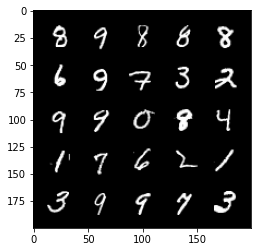

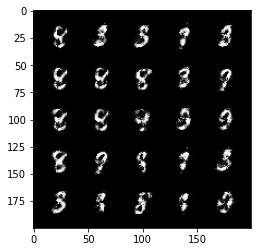

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.09243733435869217
Generator Loss : 4.169575214385986


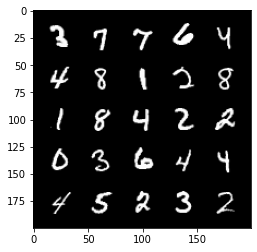

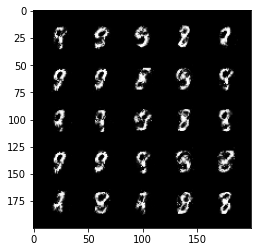

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.10303733497858047
Generator Loss : 4.079170227050781


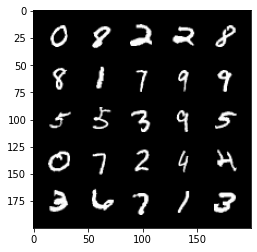

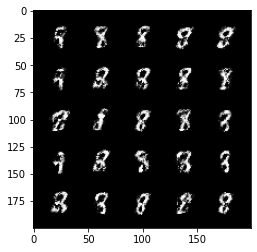

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.10346680134534836
Generator Loss : 3.9548873901367188


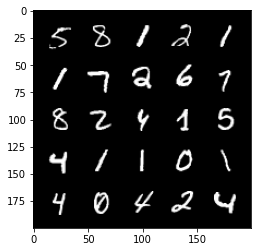

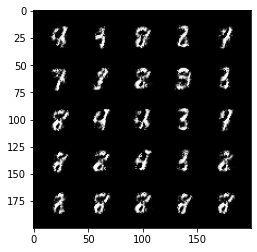

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.09339980781078339
Generator Loss : 4.227167129516602


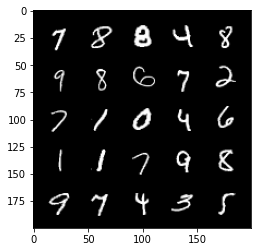

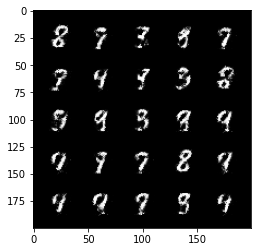

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.08879850059747696
Generator Loss : 4.261685371398926


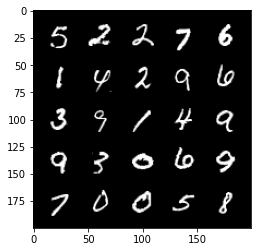

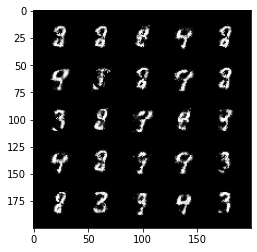

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.07294464111328125
Generator Loss : 4.35554313659668


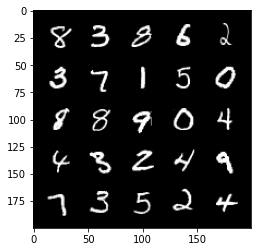

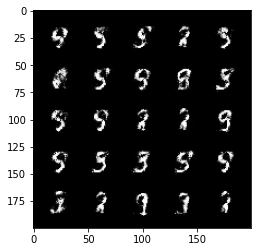

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.08867161720991135
Generator Loss : 4.577040672302246


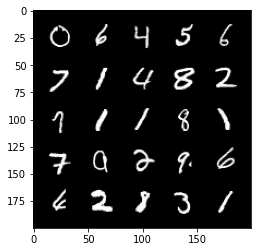

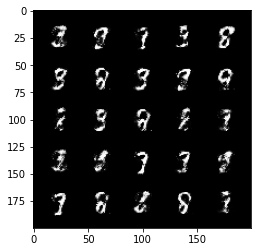

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.08580216765403748
Generator Loss : 4.6953582763671875


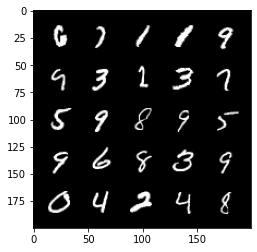

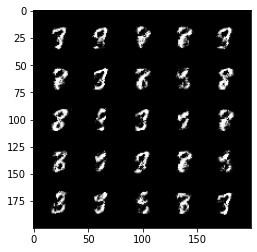

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.09753791987895966
Generator Loss : 4.270044803619385


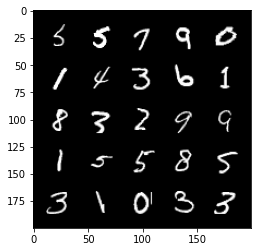

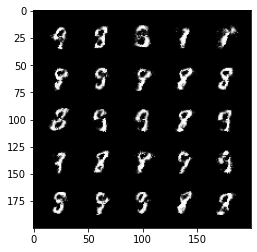

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.09157969057559967
Generator Loss : 4.186999797821045


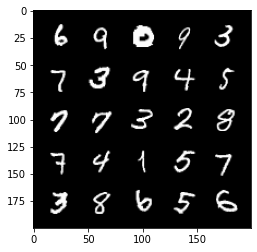

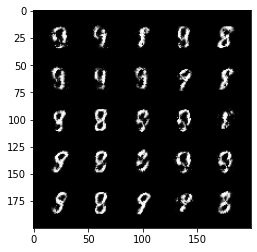

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.10454031080007553
Generator Loss : 3.9933242797851562


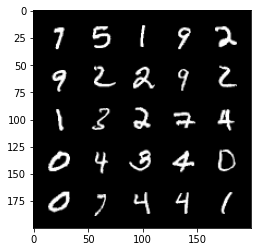

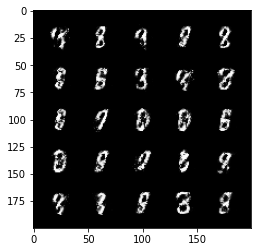

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.10280632972717285
Generator Loss : 4.100594520568848


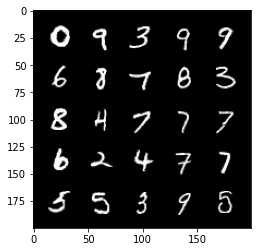

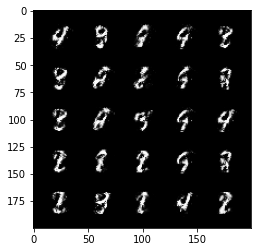

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.11423271149396896
Generator Loss : 3.9728808403015137


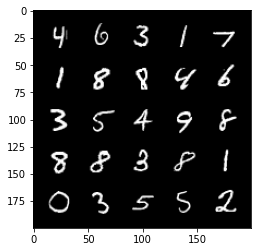

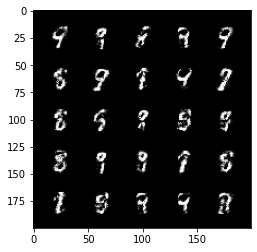

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.11875253915786743
Generator Loss : 3.9752721786499023


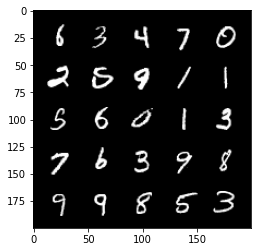

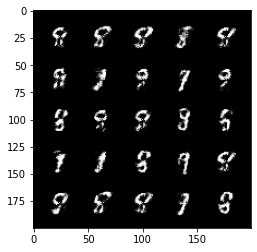

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.12788163125514984
Generator Loss : 4.0186686515808105


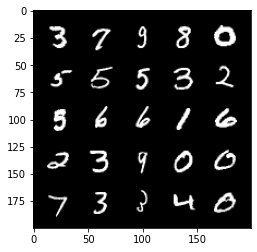

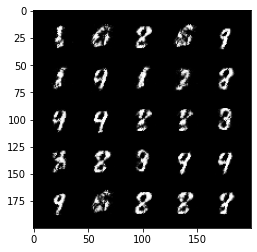

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.11567278206348419
Generator Loss : 3.95410418510437


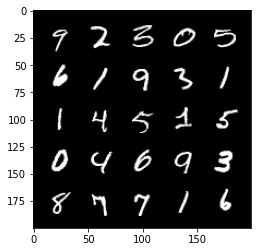

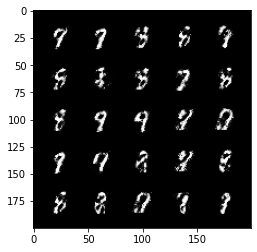

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.11421474069356918
Generator Loss : 4.0331501960754395


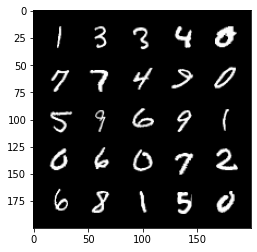

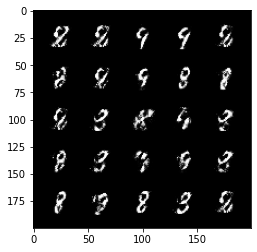

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.13432914018630981
Generator Loss : 3.9198174476623535


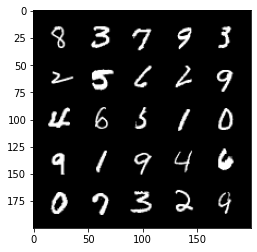

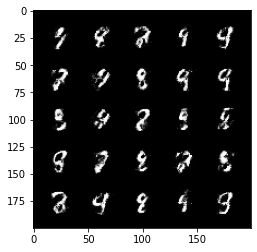

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.1393357664346695
Generator Loss : 3.9248926639556885


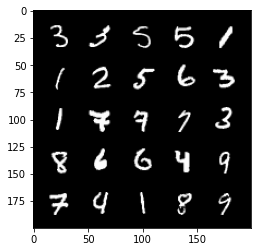

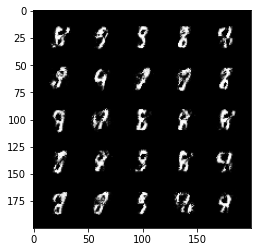

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.1503097414970398
Generator Loss : 3.719949722290039


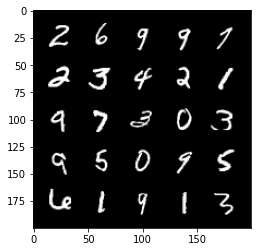

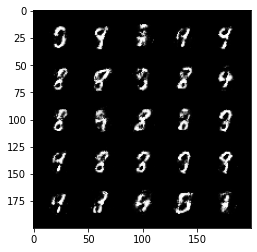

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.1421288400888443
Generator Loss : 3.7456717491149902


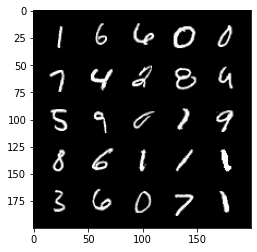

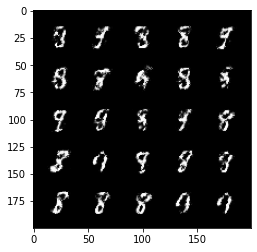

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.14646147191524506
Generator Loss : 3.712958335876465


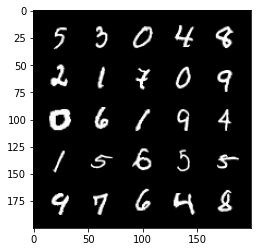

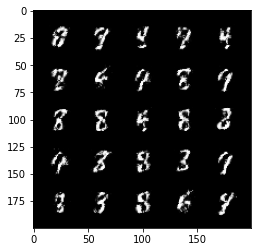

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.13184505701065063
Generator Loss : 3.768930435180664


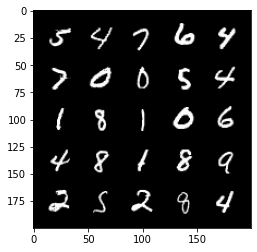

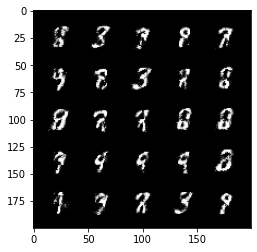

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.14737731218338013
Generator Loss : 3.7659525871276855


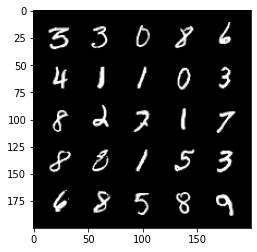

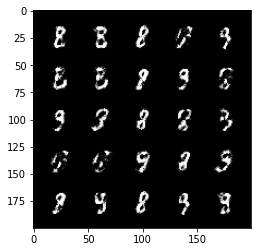

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.13833671808242798
Generator Loss : 3.6165871620178223


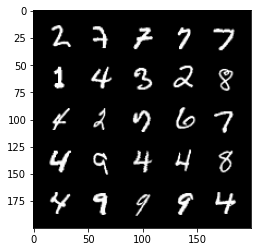

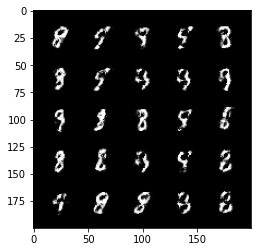

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.15184751152992249
Generator Loss : 3.516016721725464


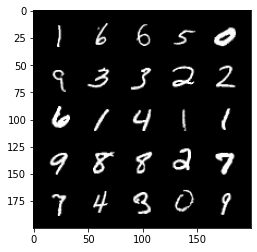

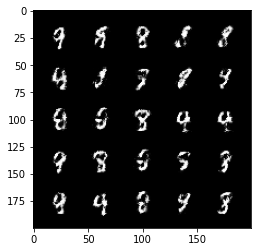

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.16298605501651764
Generator Loss : 3.4293549060821533


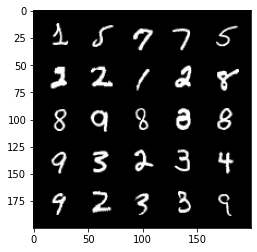

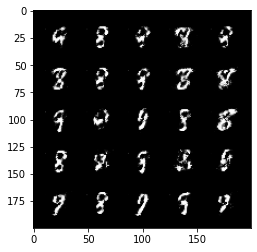

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.13656850159168243
Generator Loss : 3.6478612422943115


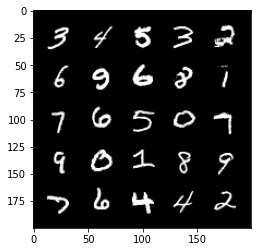

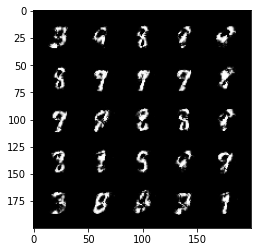

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.1481344997882843
Generator Loss : 3.5562870502471924


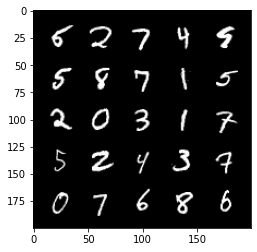

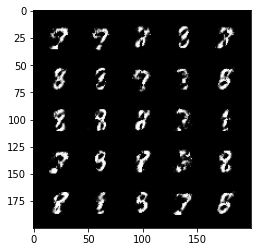

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.160879984498024
Generator Loss : 3.4307103157043457


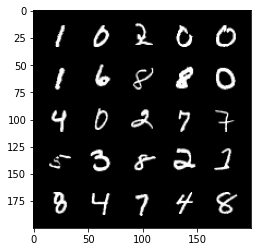

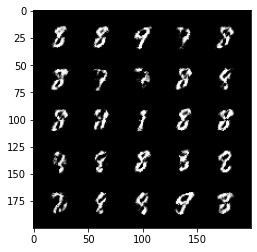

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.1629934012889862
Generator Loss : 3.4671127796173096


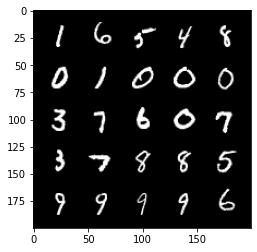

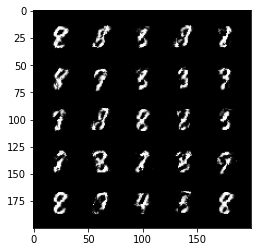

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.1652301549911499
Generator Loss : 3.40718936920166


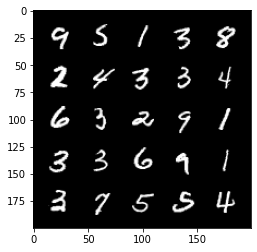

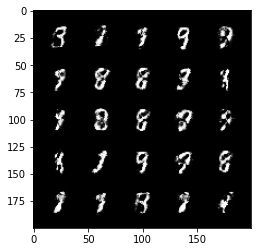

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.16887646913528442
Generator Loss : 3.266244649887085


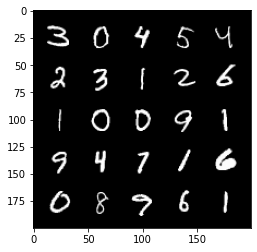

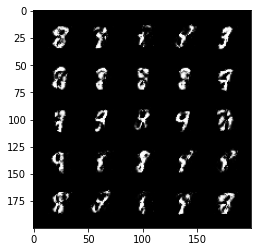

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.18325339257717133
Generator Loss : 3.202033281326294


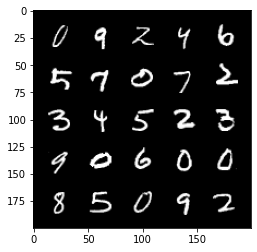

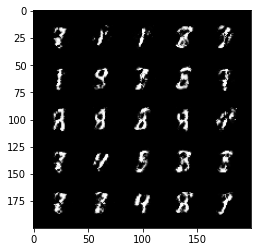

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.16481007635593414
Generator Loss : 3.266169548034668


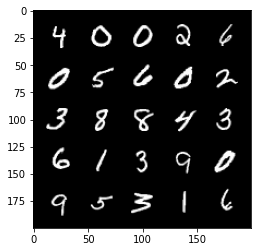

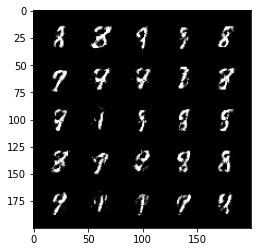

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.1841941624879837
Generator Loss : 3.1228435039520264


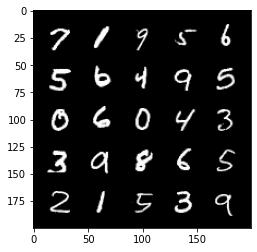

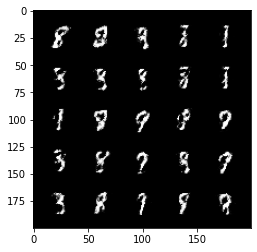

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.18227273225784302
Generator Loss : 3.2039408683776855


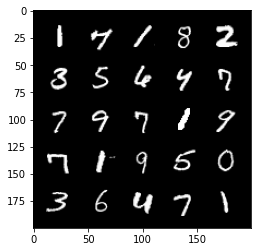

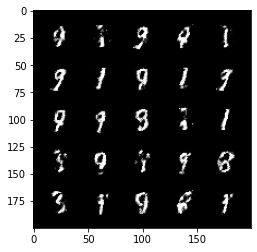

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.21342618763446808
Generator Loss : 2.9936718940734863


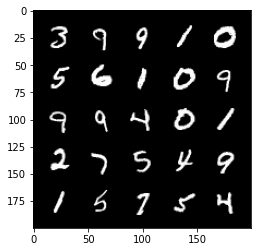

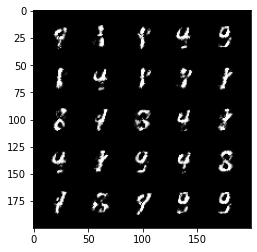

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.19410617649555206
Generator Loss : 3.0914463996887207


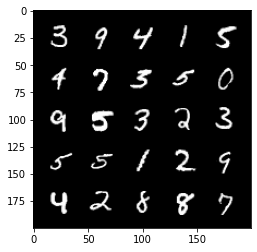

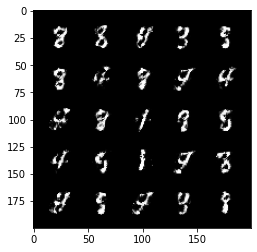

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.198960080742836
Generator Loss : 3.0576817989349365


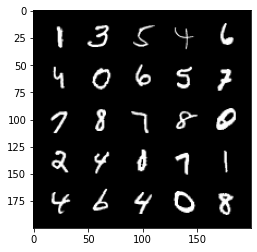

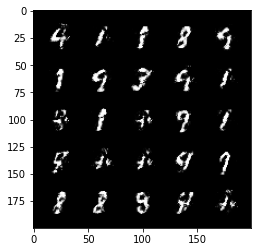

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.19634325802326202
Generator Loss : 3.126246452331543


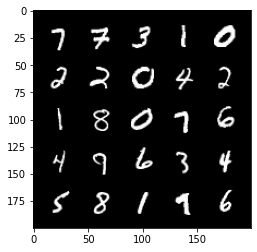

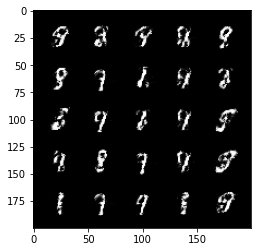

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.2048359513282776
Generator Loss : 3.062032461166382


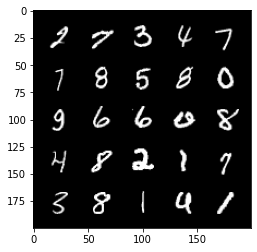

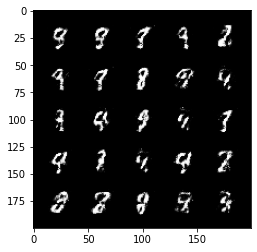

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.2140093892812729
Generator Loss : 3.0573740005493164


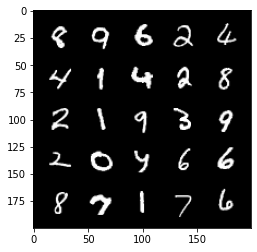

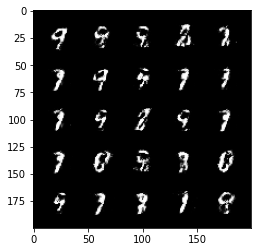

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.1999455988407135
Generator Loss : 3.1644227504730225


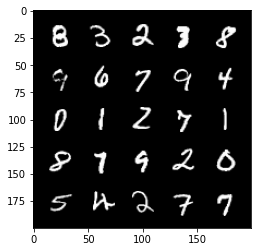

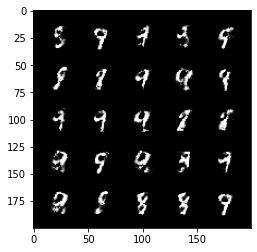

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.2125384360551834
Generator Loss : 2.8850502967834473


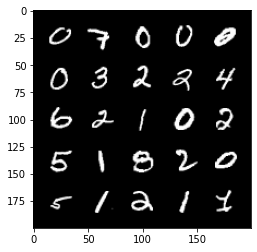

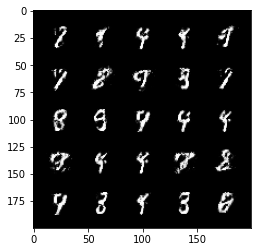

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.2035462111234665
Generator Loss : 2.954685926437378


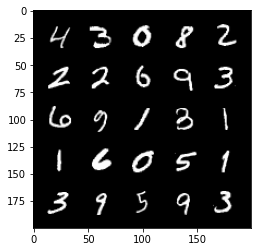

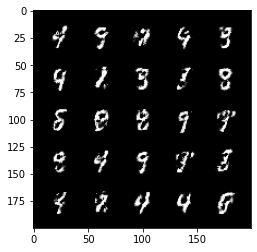

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.2143126130104065
Generator Loss : 2.8427703380584717


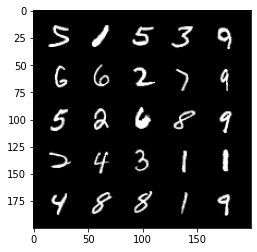

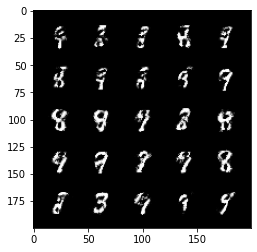

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.2191809117794037
Generator Loss : 2.8996036052703857


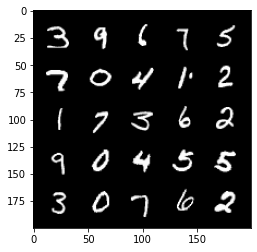

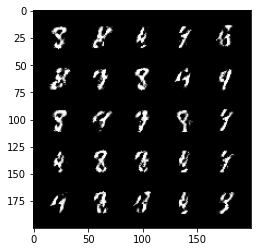

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.2269684076309204
Generator Loss : 2.819711685180664


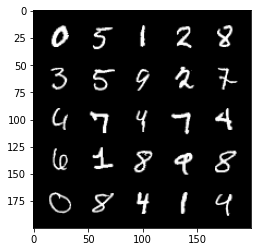

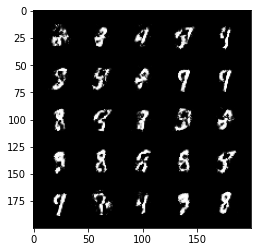

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.23749129474163055
Generator Loss : 2.8574860095977783


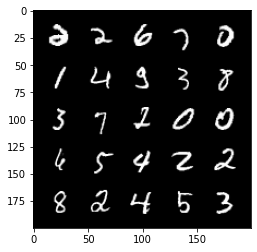

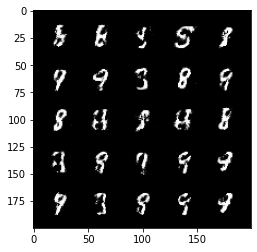

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.21958844363689423
Generator Loss : 2.832327127456665


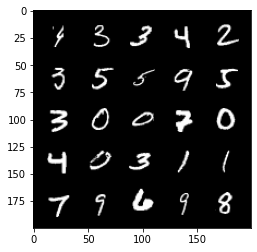

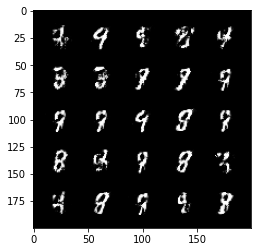

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.20074589550495148
Generator Loss : 2.9623398780822754


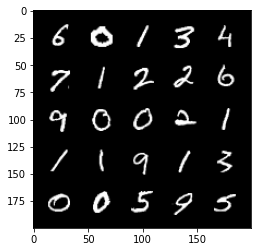

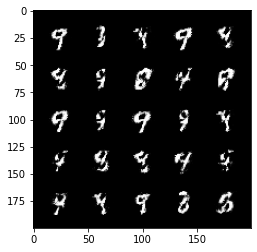

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.19573363661766052
Generator Loss : 3.136152505874634


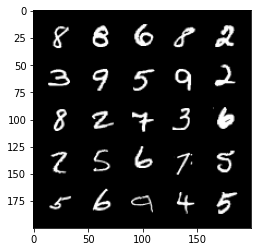

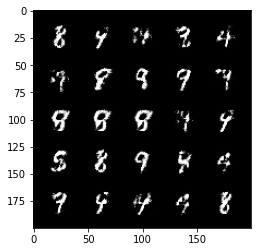

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.2275971621274948
Generator Loss : 2.790026903152466


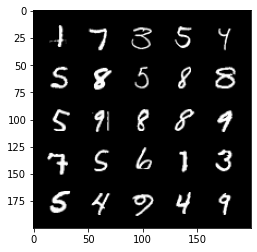

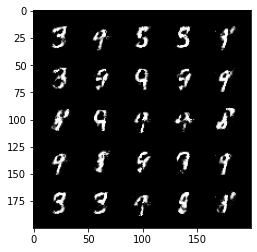

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.2235184609889984
Generator Loss : 2.747469186782837


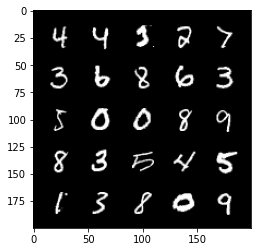

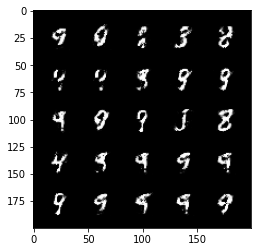

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.22384585440158844
Generator Loss : 2.654282331466675


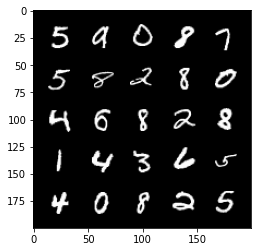

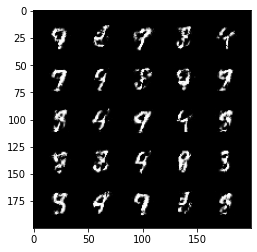

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.24362604320049286
Generator Loss : 2.658768892288208


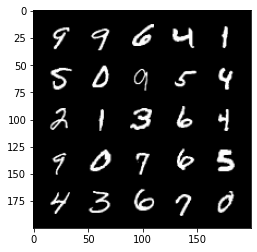

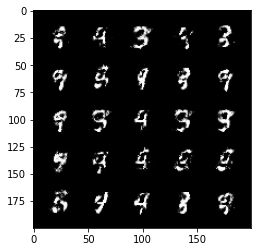

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.23057043552398682
Generator Loss : 2.670395612716675


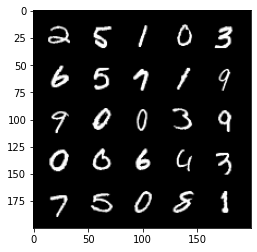

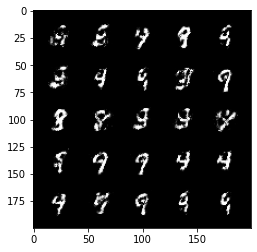

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.2503158152103424
Generator Loss : 2.5659263134002686


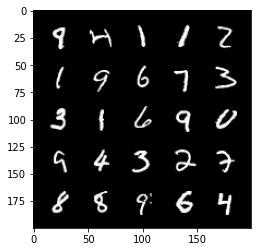

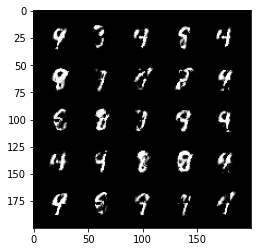

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.2230924814939499
Generator Loss : 2.703556537628174


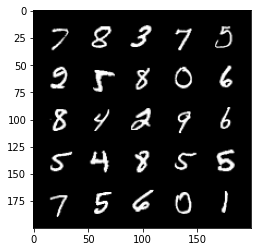

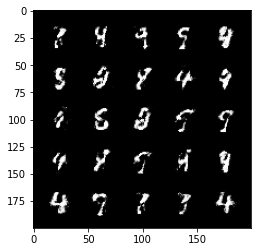

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.2628937363624573
Generator Loss : 2.4840071201324463


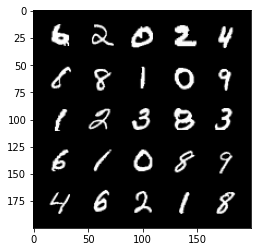

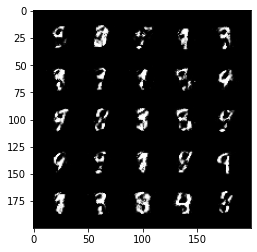

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.26570776104927063
Generator Loss : 2.4211368560791016


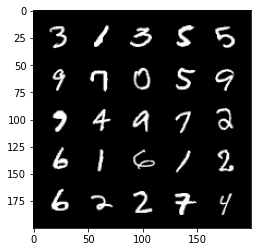

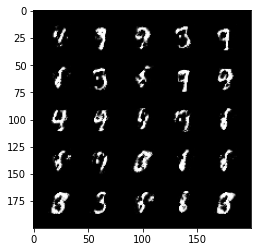

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.2683190703392029
Generator Loss : 2.538085699081421


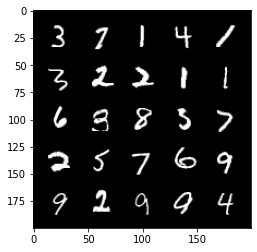

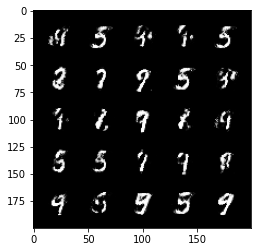

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.25435560941696167
Generator Loss : 2.5140323638916016


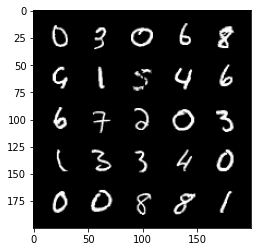

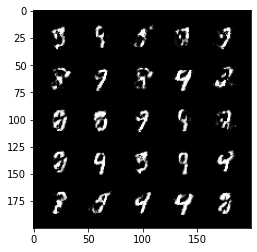

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.26527878642082214
Generator Loss : 2.4552500247955322


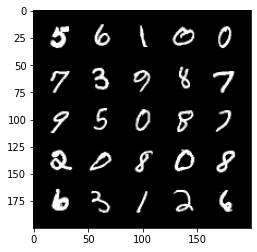

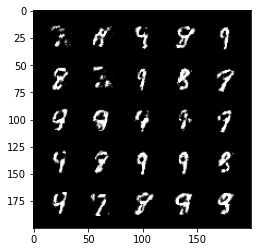

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.2805880606174469
Generator Loss : 2.356457233428955


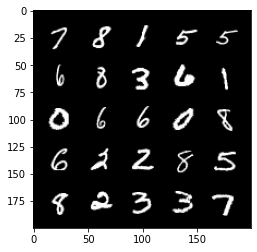

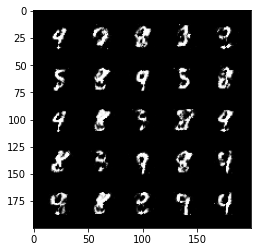

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.27597540616989136
Generator Loss : 2.3588967323303223


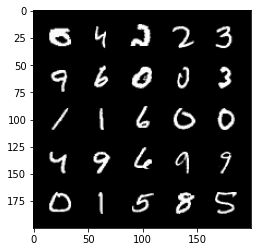

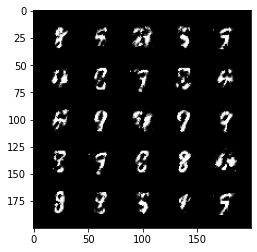

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.2787618339061737
Generator Loss : 2.3994243144989014


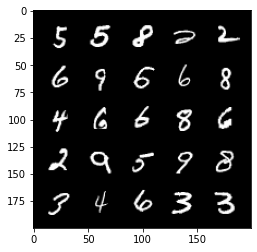

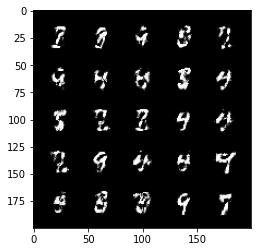

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.2906857430934906
Generator Loss : 2.3785476684570312


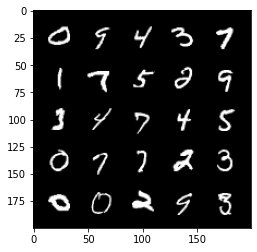

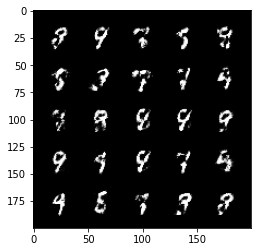

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.287527859210968
Generator Loss : 2.278857469558716


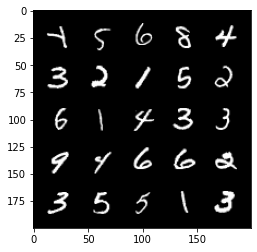

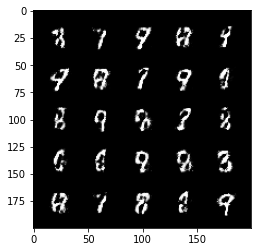

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.26844096183776855
Generator Loss : 2.3559205532073975


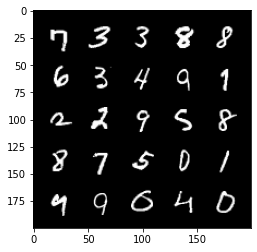

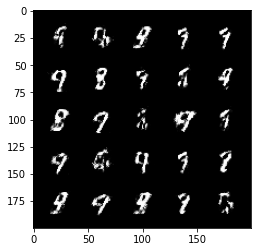

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.28451064229011536
Generator Loss : 2.2773184776306152


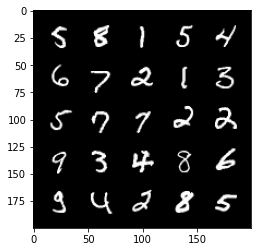

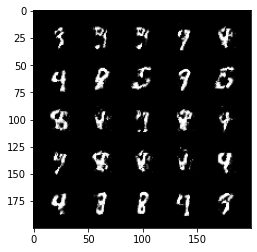

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.2688440978527069
Generator Loss : 2.3818047046661377


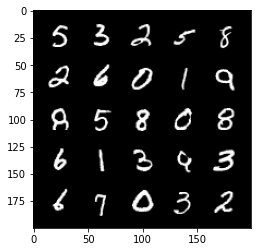

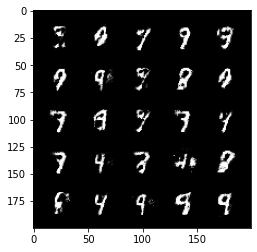

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.2981868088245392
Generator Loss : 2.2268688678741455


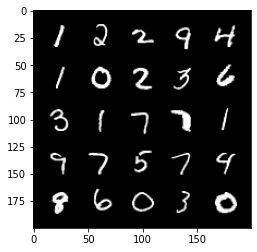

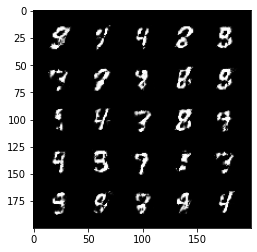

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.29572343826293945
Generator Loss : 2.1732234954833984


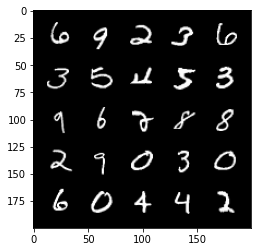

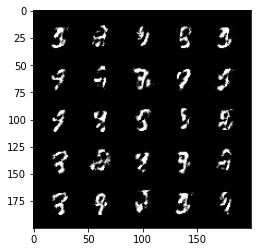

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.2851250171661377
Generator Loss : 2.248853921890259


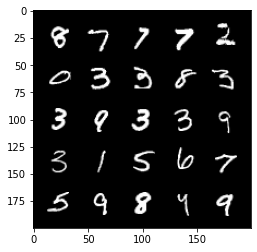

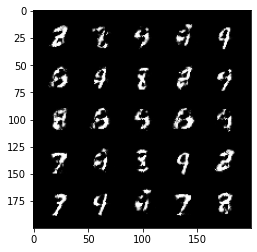

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.2939203679561615
Generator Loss : 2.1958911418914795


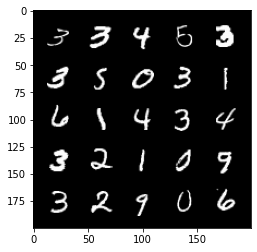

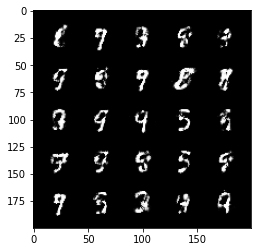

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.31780296564102173
Generator Loss : 2.0887575149536133


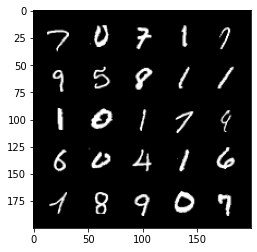

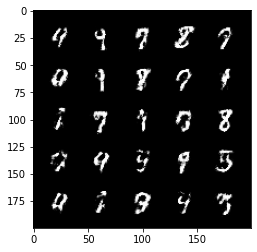

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.3326815366744995
Generator Loss : 2.009387254714966


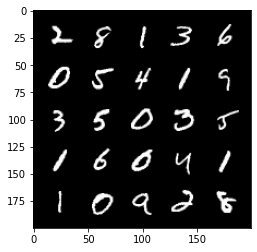

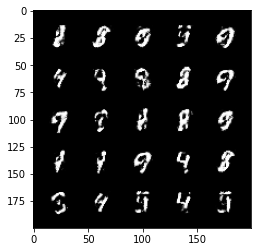

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.32974040508270264
Generator Loss : 2.0016369819641113


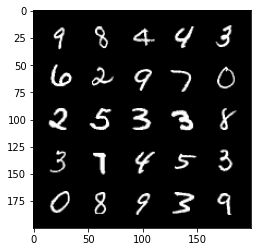

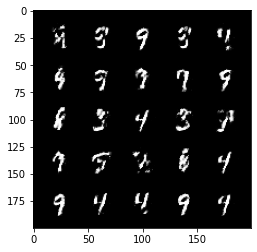

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.3166210949420929
Generator Loss : 2.060953378677368


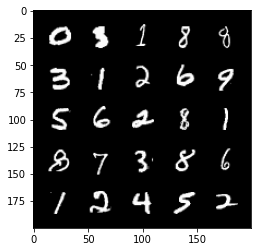

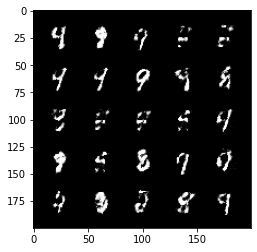

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.3199861943721771
Generator Loss : 2.0162353515625


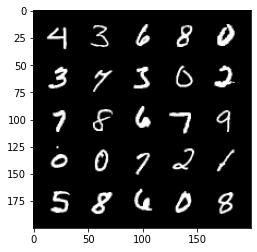

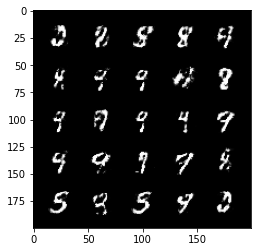

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.3126371502876282
Generator Loss : 2.0020883083343506


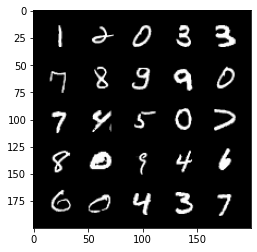

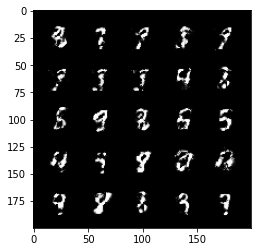

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.3390911817550659
Generator Loss : 1.9503904581069946


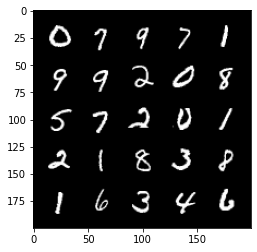

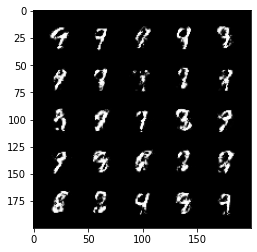

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.35017329454421997
Generator Loss : 1.8728032112121582


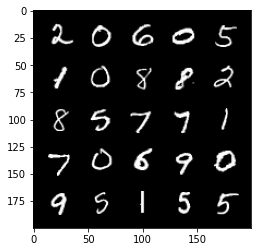

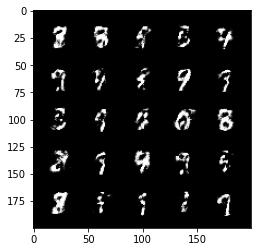

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.32190102338790894
Generator Loss : 1.9643447399139404


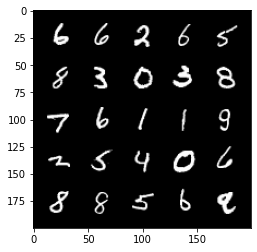

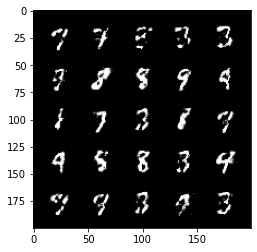

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.33849412202835083
Generator Loss : 1.9171664714813232


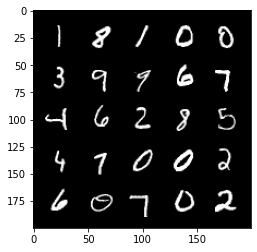

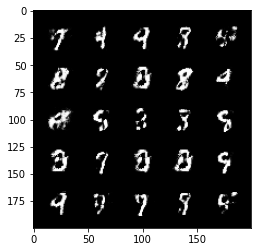

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.3556232452392578
Generator Loss : 1.8846182823181152


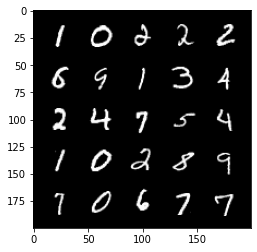

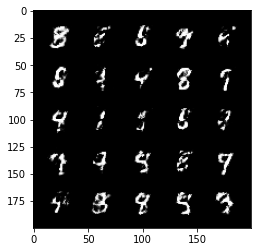

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.3441148102283478
Generator Loss : 1.85662841796875


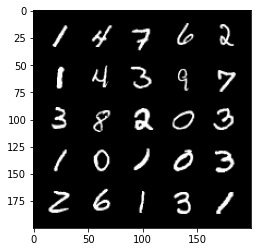

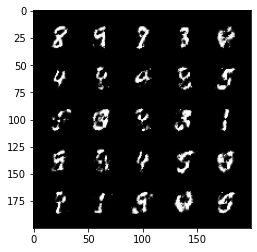

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.33202213048934937
Generator Loss : 1.9548757076263428


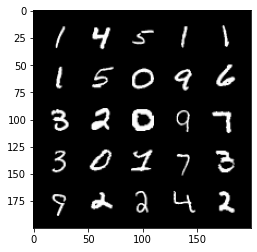

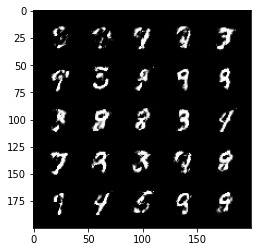

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.34874969720840454
Generator Loss : 1.8631539344787598


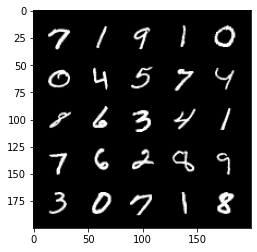

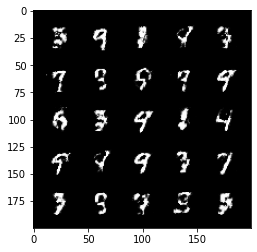

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.33566033840179443
Generator Loss : 1.8940385580062866


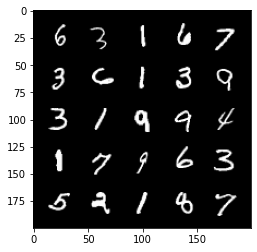

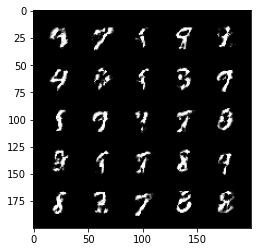

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.33469462394714355
Generator Loss : 1.8859364986419678


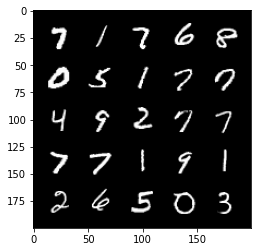

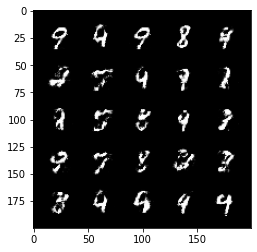

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.34644171595573425
Generator Loss : 1.8540027141571045


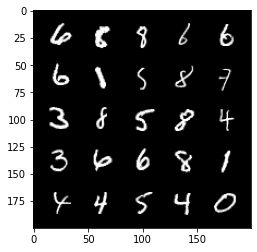

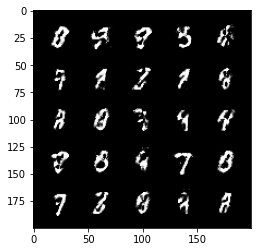

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.3579975664615631
Generator Loss : 1.8324679136276245


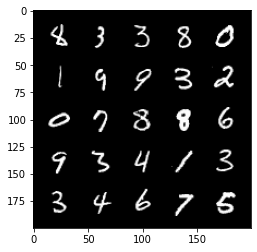

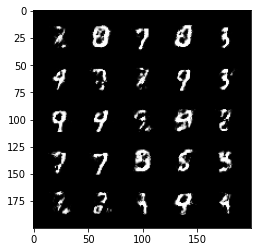

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.32871678471565247
Generator Loss : 1.860839605331421


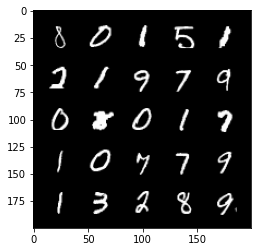

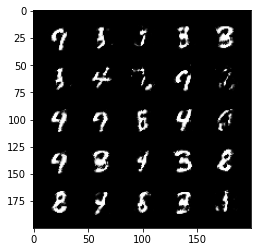

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.30821743607521057
Generator Loss : 1.9510983228683472


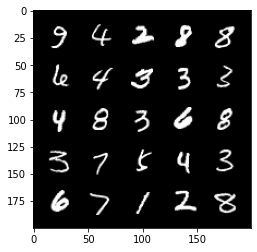

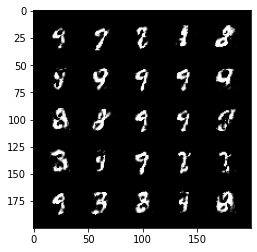

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.2991812825202942
Generator Loss : 2.0369231700897217


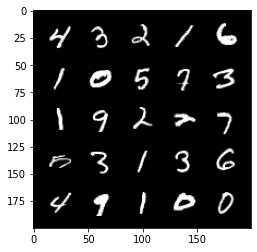

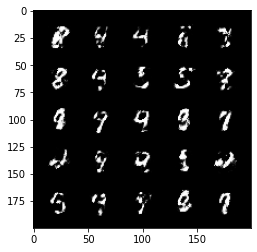

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.3492777943611145
Generator Loss : 1.850159764289856


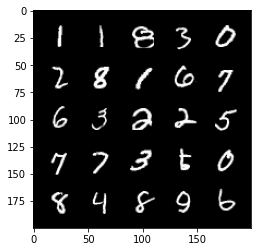

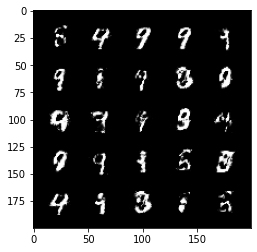

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.34050390124320984
Generator Loss : 1.8885011672973633


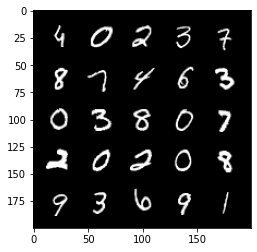

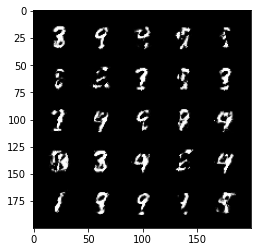

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.32645168900489807
Generator Loss : 1.9052762985229492


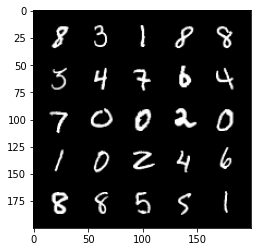

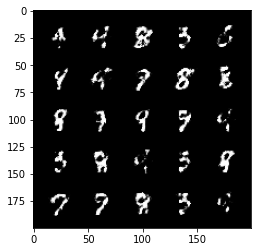

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.3138663172721863
Generator Loss : 1.9817343950271606


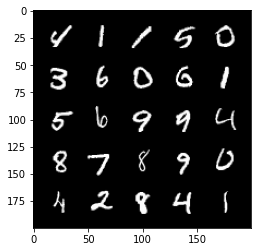

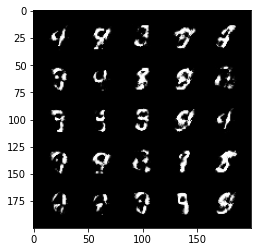

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.32714635133743286
Generator Loss : 1.903528094291687


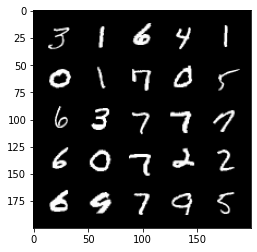

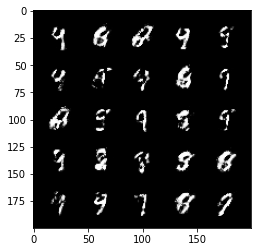

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.3346254229545593
Generator Loss : 1.8616259098052979


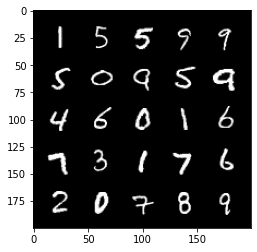

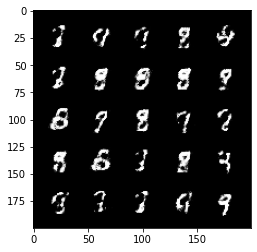

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.33156925439834595
Generator Loss : 1.8943477869033813


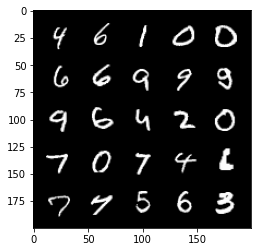

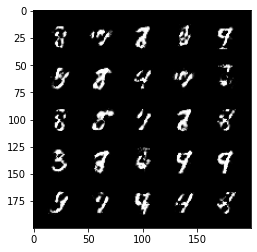

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.33086705207824707
Generator Loss : 1.8828152418136597


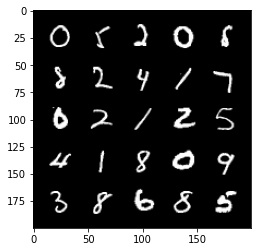

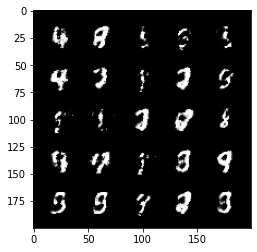

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.3068088889122009
Generator Loss : 1.9491841793060303


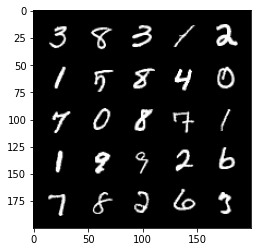

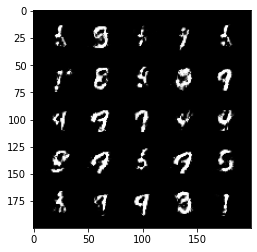

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.32666441798210144
Generator Loss : 1.9234120845794678


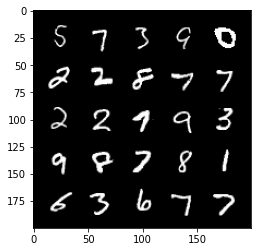

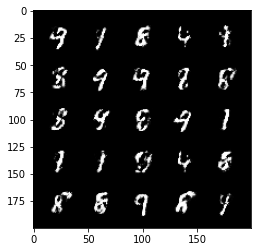

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.33441007137298584
Generator Loss : 1.9199154376983643


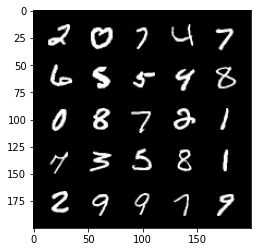

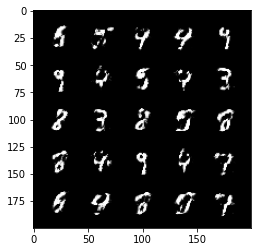

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.3424086272716522
Generator Loss : 1.8821136951446533


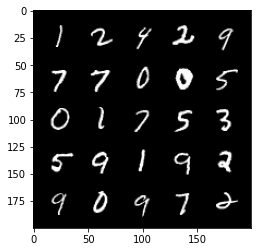

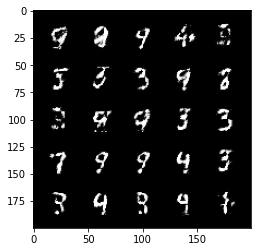

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.3372745215892792
Generator Loss : 1.8514081239700317


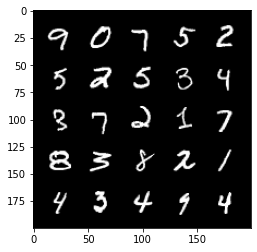

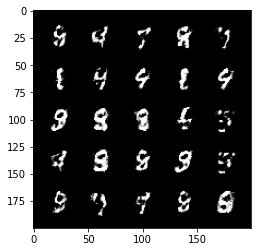

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.3099956214427948
Generator Loss : 1.9385391473770142


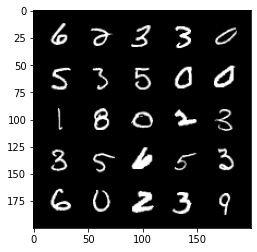

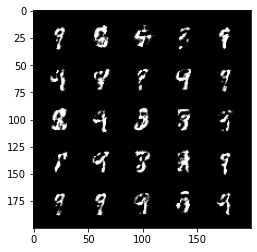

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.35499778389930725
Generator Loss : 1.8551219701766968


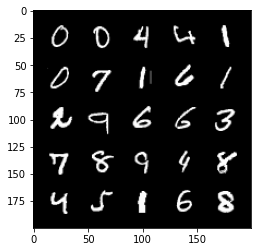

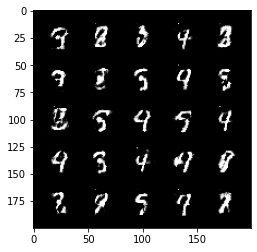

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.3290492296218872
Generator Loss : 1.9286123514175415


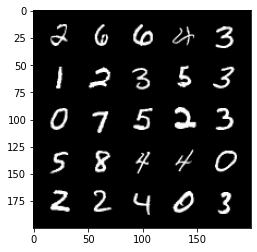

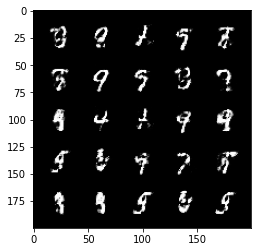

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.3368084728717804
Generator Loss : 1.8860507011413574


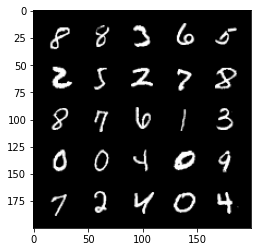

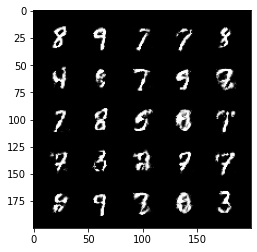

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.3135831356048584
Generator Loss : 1.9708502292633057


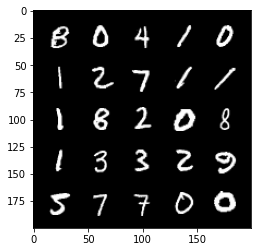

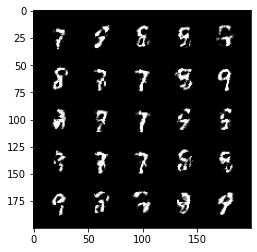

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.3500808775424957
Generator Loss : 1.8218258619308472


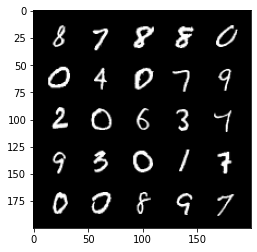

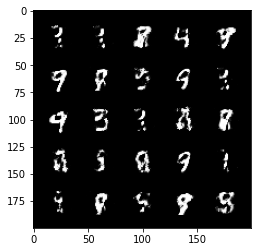

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.3249024748802185
Generator Loss : 1.8830885887145996


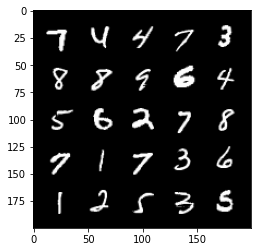

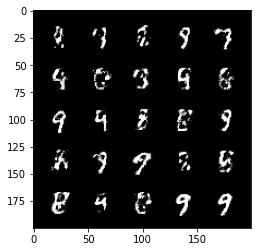

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.32960712909698486
Generator Loss : 1.8878917694091797


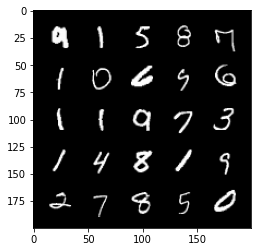

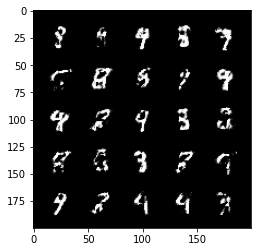

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.33966392278671265
Generator Loss : 1.8254854679107666


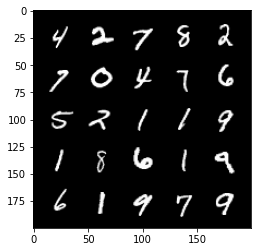

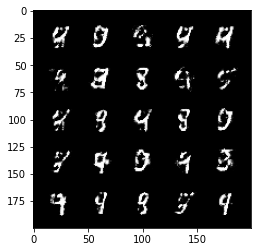

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.3576506972312927
Generator Loss : 1.7693532705307007


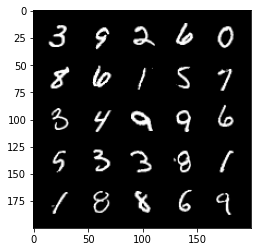

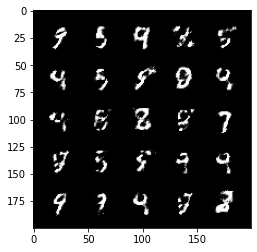

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.3493911623954773
Generator Loss : 1.7611973285675049


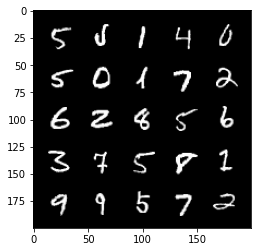

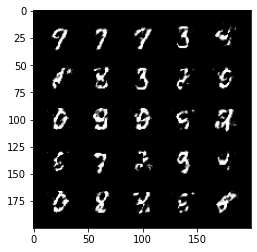

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.3444097340106964
Generator Loss : 1.7980527877807617


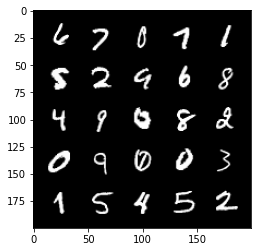

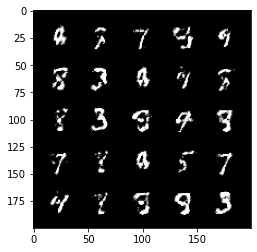

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.3414395749568939
Generator Loss : 1.7739241123199463


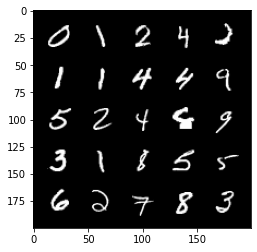

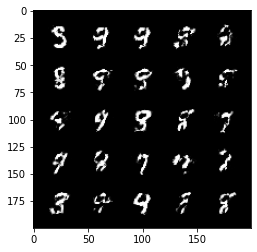

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.32475778460502625
Generator Loss : 1.8897968530654907


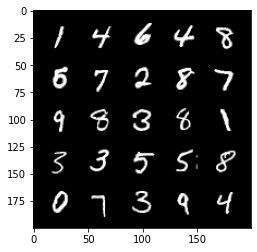

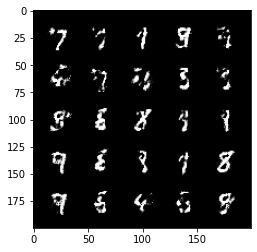

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.31783702969551086
Generator Loss : 1.8804007768630981


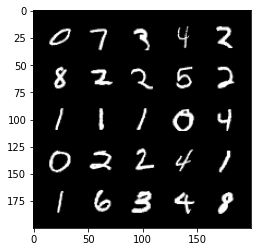

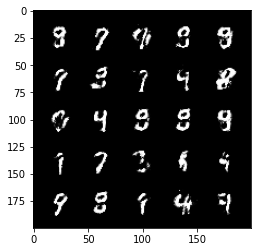

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.35304346680641174
Generator Loss : 1.7410521507263184


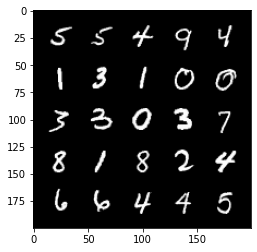

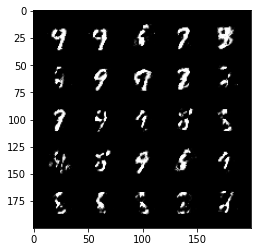

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.35568293929100037
Generator Loss : 1.6866281032562256


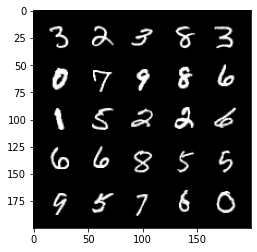

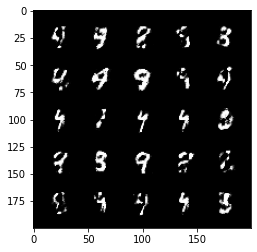

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.35609933733940125
Generator Loss : 1.706030249595642


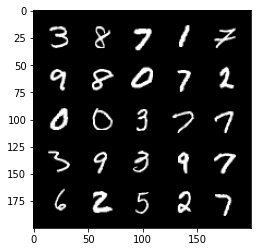

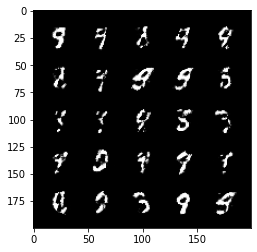

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.34976598620414734
Generator Loss : 1.8121204376220703


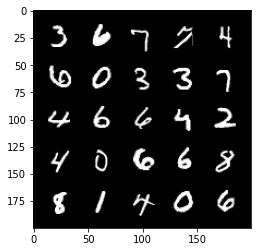

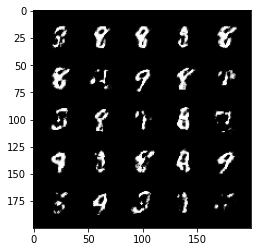

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.34008970856666565
Generator Loss : 1.776902198791504


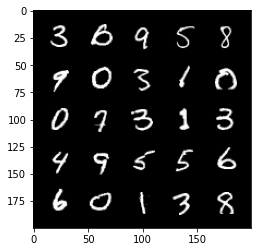

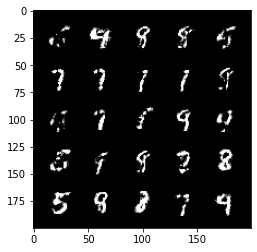

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.34468886256217957
Generator Loss : 1.7741665840148926


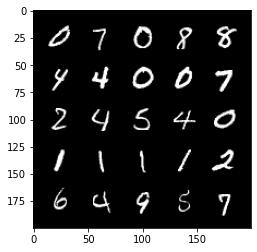

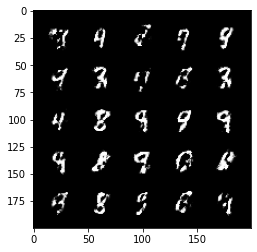

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.36294791102409363
Generator Loss : 1.6893717050552368


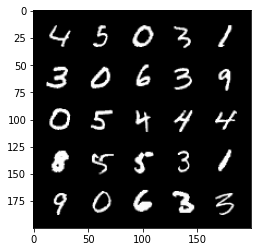

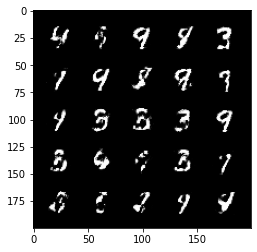

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.33367928862571716
Generator Loss : 1.8167134523391724


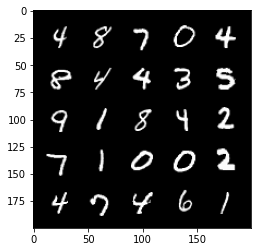

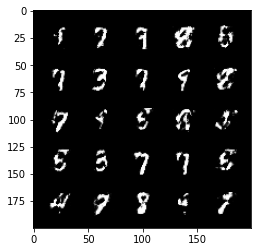

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.35849881172180176
Generator Loss : 1.7251591682434082


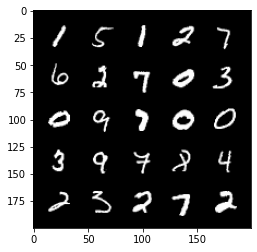

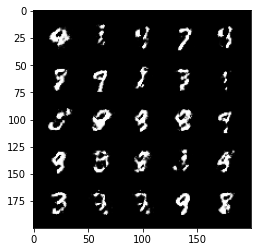

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.37839633226394653
Generator Loss : 1.6207904815673828


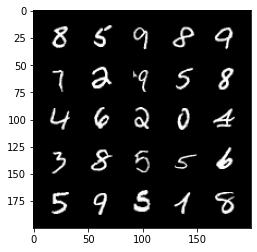

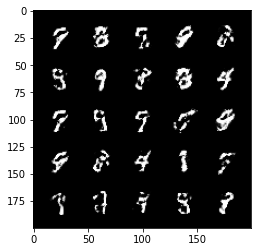

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.380972683429718
Generator Loss : 1.6136218309402466


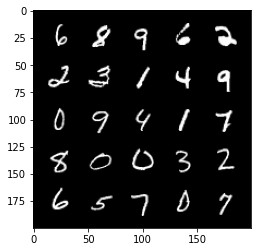

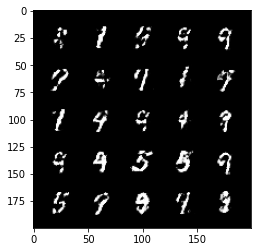

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.395243763923645
Generator Loss : 1.5473318099975586


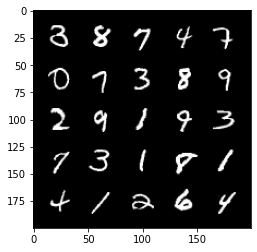

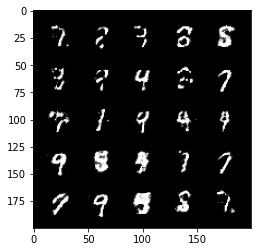

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.39231714606285095
Generator Loss : 1.579759120941162


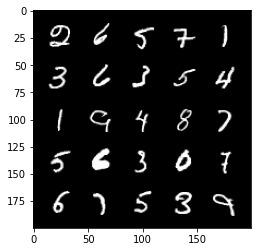

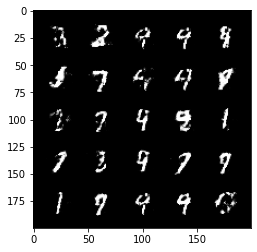

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.41437235474586487
Generator Loss : 1.4925910234451294


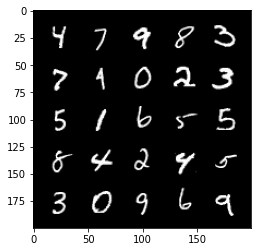

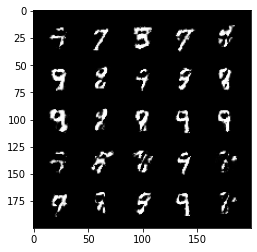

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.38543185591697693
Generator Loss : 1.590417742729187


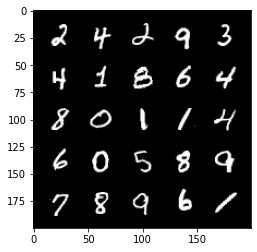

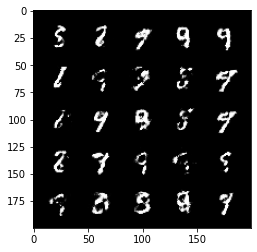

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.3828107714653015
Generator Loss : 1.574894905090332


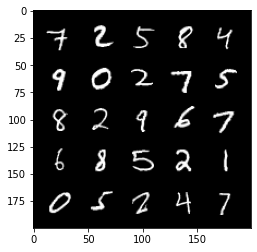

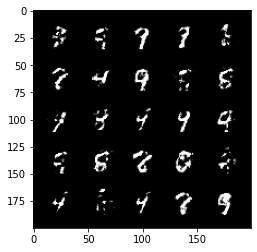

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.38085535168647766
Generator Loss : 1.6033447980880737


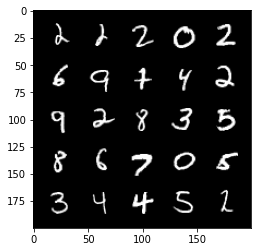

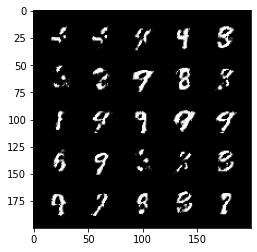

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.4075288474559784
Generator Loss : 1.5261695384979248


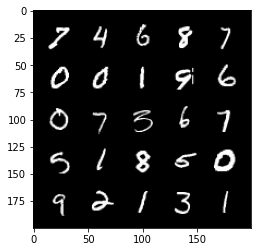

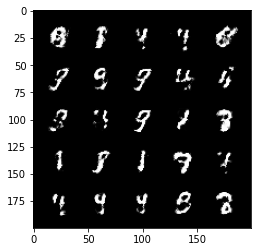

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.38668903708457947
Generator Loss : 1.5605956315994263


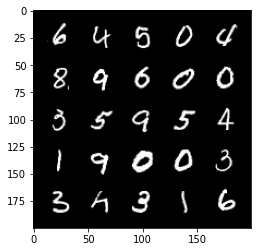

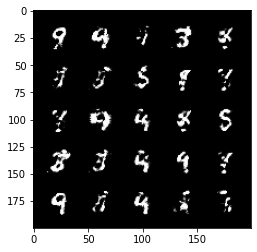

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.39169004559516907
Generator Loss : 1.5838425159454346


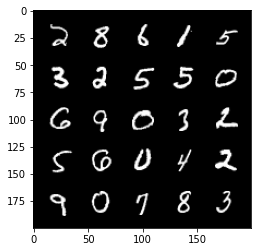

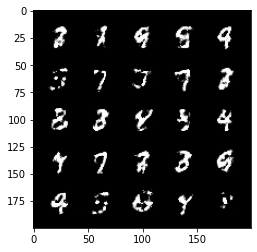

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.3939516544342041
Generator Loss : 1.5665572881698608


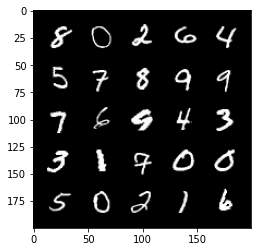

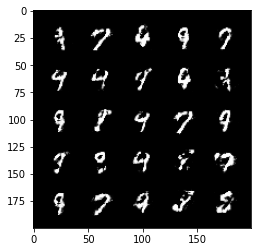

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.3890395164489746
Generator Loss : 1.571294903755188


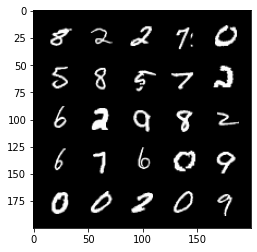

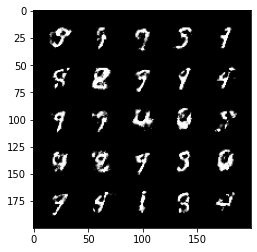

  0%|          | 0/469 [00:00<?, ?it/s]

Discriminator Loss : 0.412485271692276
Generator Loss : 1.5099365711212158


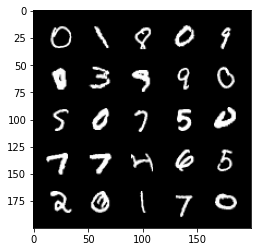

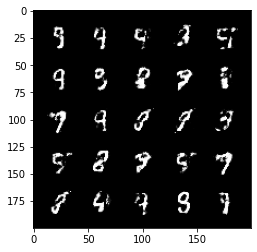

In [116]:
discriminator_loss = 0
generator_loss = 0
curr_step = 1
display_step = 500
for epoch in range(n_epochs):
    for real_imgs, _ in tqdm(dataloader):
        curr_batch_size = len(real_imgs)
        
        real_imgs = real_imgs.view(curr_batch_size, -1).to(device)
        disc_opt.zero_grad() 
        disc_loss = get_disc_loss(gen, disc, criterion, real_imgs, curr_batch_size, z_dim, device)
        disc_loss.backward(retain_graph = True)
        disc_opt.step()
        
        gen_opt.zero_grad()
        gen_loss = get_gen_loss(gen, disc, criterion, curr_batch_size, z_dim, device)
        gen_loss.backward(retain_graph = True)
        gen_opt.step()
        
        discriminator_loss += disc_loss / display_step
        generator_loss += gen_loss / display_step
        if curr_step % display_step == 0:
            print(f"Discriminator Loss : {discriminator_loss}")
            print(f"Generator Loss : {generator_loss}")
            noise = get_noise(curr_batch_size, z_dim, device)
            fake_imgs = gen(noise)
            
            show_tensor_images(real_imgs)
            show_tensor_images(fake_imgs)
            discriminator_loss = 0
            generator_loss = 0
        curr_step += 1

In [78]:
device

device(type='cuda')